In [1]:
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import numpy as np
import time
import copy
import sys
from datetime import datetime
from joblib import Parallel, delayed
import os
from scipy.stats import multivariate_normal
import plotly.graph_objects as go
from chart_studio.plotly import iplot
from matplotlib.colors import ListedColormap

import tensorflow as tf
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
import tensorboard
from keras.utils.vis_utils import plot_model
from ann_visualizer.visualize import ann_viz

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_curve, auc, f1_score, precision_score, recall_score
from sklearn.svm import SVC, LinearSVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier, ExtraTreesClassifier, AdaBoostClassifier, IsolationForest

from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler, Normalizer, MaxAbsScaler, StandardScaler, StandardScaler, RobustScaler
from sklearn.model_selection import GridSearchCV, cross_val_score, GridSearchCV, train_test_split, cross_validate, KFold, RandomizedSearchCV
from sklearn.pipeline import Pipeline
import xgboost as xgb
from sklearn.metrics import mean_squared_error, matthews_corrcoef
from sklearn.naive_bayes import GaussianNB, MultinomialNB
plt.style.use('ggplot')
sns.set()

Using TensorFlow backend.


In [2]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:51484")
client

C:\Users\Pritesh\Anaconda3\lib\site-packages\distributed\client.py:1137: VersionMismatchWarning: Mismatched versions found

+---------+--------+-----------+---------+
| Package | client | scheduler | workers |
+---------+--------+-----------+---------+
| dask    | 2.25.0 | 2.20.0    | 2.25.0  |
+---------+--------+-----------+---------+
  warnings.warn(version_module.VersionMismatchWarning(msg[0]["warning"]))


Client Scheduler: tcp://127.0.0.1:51484 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 4 Cores: 12 Memory: 17.13 GB


In [3]:
tf.__version__

'2.1.0'

In [4]:
pd.set_option('precision', 3)

In [5]:
df_train_original = pd.read_csv('Financial/train_data.csv')
df_train_hidden = pd.read_csv('Financial/test_data_hidden.csv')
df_test = pd.read_csv('Financial/test_data.csv')
frame = [df_train_original,df_train_hidden]
df = pd.concat(frame)

In [6]:
df_train = copy.deepcopy(df_train_original)

# EDA

In [7]:
df.shape

(284807, 31)

In [8]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,38355.0,1.044,0.319,1.046,2.806,-0.561,-0.368,0.033,-0.042,-0.323,...,-0.240,-0.680,0.085,0.685,0.319,-0.205,0.002,0.038,49.67,0
1,22555.0,-1.665,0.808,1.806,1.903,-0.822,0.935,-0.825,0.976,1.747,...,-0.335,-0.511,0.036,0.148,-0.529,-0.567,-0.596,-0.220,16.94,0
2,2431.0,-0.324,0.602,0.865,-2.138,0.295,-1.252,1.072,-0.335,1.071,...,0.012,0.353,-0.342,-0.146,0.094,-0.804,0.229,-0.022,1.00,0
3,86773.0,-0.258,1.218,-0.585,-0.875,1.222,-0.311,1.074,-0.161,0.201,...,-0.425,-0.781,0.019,0.179,-0.316,0.097,0.270,-0.021,10.78,0
4,127202.0,2.142,-0.495,-1.937,-0.818,-0.025,-1.027,-0.152,-0.306,-0.869,...,0.010,0.022,0.079,-0.481,0.024,-0.279,-0.030,-0.044,39.96,0


## Perform an EDA on the Dataset.
   * ### Check all the latent features and parameters with their mean and standard deviation. Value are close to 0 centered (mean) with unit standard deviation

In [9]:
df.iloc[:, [x for x in range(1,29)]].describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
count,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,...,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05,2.848e+05
mean,1.254e-15,3.285e-16,-1.401e-15,2.054e-15,1.021e-15,1.498e-15,-5.773e-16,1.195e-16,-2.420e-15,2.281e-15,...,1.035e-15,6.482e-16,1.622e-16,-3.311e-16,2.561e-16,4.488e-15,5.294e-16,1.679e-15,-3.501e-16,-1.357e-16
std,1.959e+00,1.651e+00,1.516e+00,1.416e+00,1.380e+00,1.332e+00,1.237e+00,1.194e+00,1.099e+00,1.089e+00,...,8.140e-01,7.709e-01,7.345e-01,7.257e-01,6.245e-01,6.056e-01,5.213e-01,4.822e-01,4.036e-01,3.301e-01
min,-5.641e+01,-7.272e+01,-4.833e+01,-5.683e+00,-1.137e+02,-2.616e+01,-4.356e+01,-7.322e+01,-1.343e+01,-2.459e+01,...,-7.214e+00,-5.450e+01,-3.483e+01,-1.093e+01,-4.481e+01,-2.837e+00,-1.030e+01,-2.605e+00,-2.257e+01,-1.543e+01
25%,-9.204e-01,-5.985e-01,-8.904e-01,-8.486e-01,-6.916e-01,-7.683e-01,-5.541e-01,-2.086e-01,-6.431e-01,-5.354e-01,...,-4.563e-01,-2.117e-01,-2.284e-01,-5.424e-01,-1.618e-01,-3.546e-01,-3.171e-01,-3.270e-01,-7.084e-02,-5.296e-02
50%,1.811e-02,6.549e-02,1.798e-01,-1.985e-02,-5.434e-02,-2.742e-01,4.010e-02,2.236e-02,-5.143e-02,-9.292e-02,...,3.735e-03,-6.248e-02,-2.945e-02,6.782e-03,-1.119e-02,4.098e-02,1.659e-02,-5.214e-02,1.342e-03,1.124e-02
75%,1.316e+00,8.037e-01,1.027e+00,7.433e-01,6.119e-01,3.986e-01,5.704e-01,3.273e-01,5.971e-01,4.539e-01,...,4.589e-01,1.330e-01,1.864e-01,5.286e-01,1.476e-01,4.395e-01,3.507e-01,2.410e-01,9.105e-02,7.828e-02
max,2.455e+00,2.206e+01,9.383e+00,1.688e+01,3.480e+01,7.330e+01,1.206e+02,2.001e+01,1.559e+01,2.375e+01,...,5.592e+00,3.942e+01,2.720e+01,1.050e+01,2.253e+01,4.585e+00,7.520e+00,3.517e+00,3.161e+01,3.385e+01


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 284807 entries, 0 to 56961
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     284

In [11]:
df.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

C:\Users\Pritesh\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='Class'>

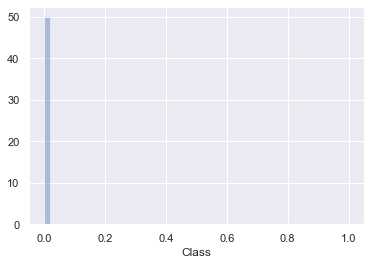

In [12]:
# df.Class.plot.bar()
sns.distplot(df.Class)

* ### Find if there is any connection between Time, Amount, and the transaction being fraudulent.

#### Time

<AxesSubplot:title={'center':'Distribution of Time Feature'}, xlabel='Time'>

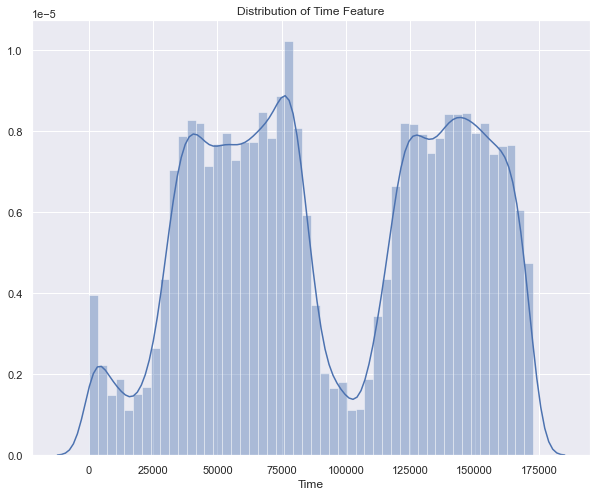

In [13]:
#visualizations of time and amount
plt.figure(figsize=(10,8))
plt.title('Distribution of Time Feature')
sns.distplot(df.Time)

In [14]:
# Let's convert the time from seconds to hours to ease the interpretation.
df.loc[:,'Time'] = df.Time / 3600
df['Time'].max() / 24

1.9999074074074075

Text(0.5, 1.0, 'Transaction Times')

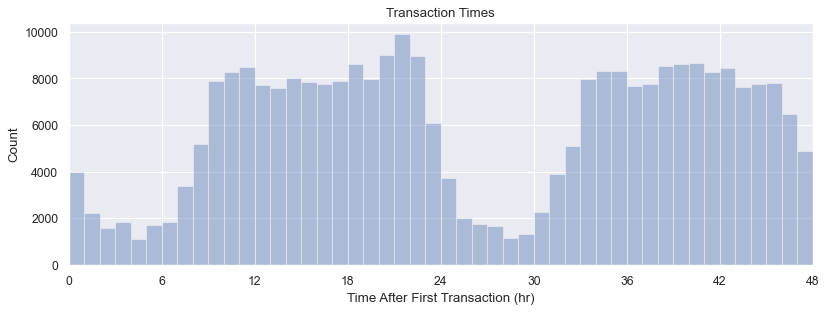

In [15]:
plt.figure(figsize=(12,4), dpi=80)
sns.distplot(df['Time'], bins=48, kde=False)
plt.xlim([0,48])
plt.xticks(np.arange(0,54,6))
plt.xlabel('Time After First Transaction (hr)')
plt.ylabel('Count')
plt.title('Transaction Times')

In [16]:
df['Time'].describe()

count    284807.000
mean         26.337
std          13.191
min           0.000
25%          15.056
50%          23.526
75%          38.700
max          47.998
Name: Time, dtype: float64

#### Amount

In [17]:
df['Amount'].describe()

count    284807.000
mean         88.350
std         250.120
min           0.000
25%           5.600
50%          22.000
75%          77.165
max       25691.160
Name: Amount, dtype: float64

Text(0.5, 1.0, 'Transaction Amounts')

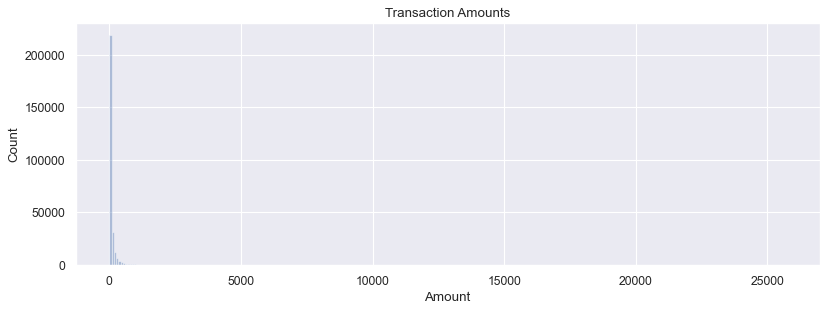

In [18]:
plt.figure(figsize=(12,4), dpi=80)
sns.distplot(df['Amount'], bins=300, kde=False)
plt.ylabel('Count')
plt.title('Transaction Amounts')

Text(0.5, 1.0, 'Transaction Amounts')

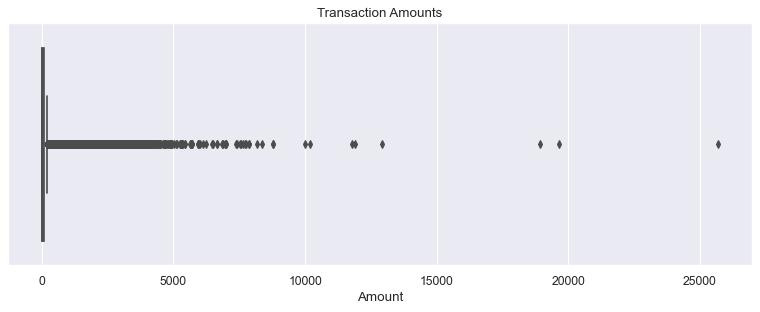

In [19]:
plt.figure(figsize=(12,4), dpi=80)
sns.boxplot(df['Amount'])
plt.title('Transaction Amounts')

In [20]:
df['Amount'].skew()

16.977724453761013

#### Time vs Amount

C:\Users\Pritesh\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2264: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


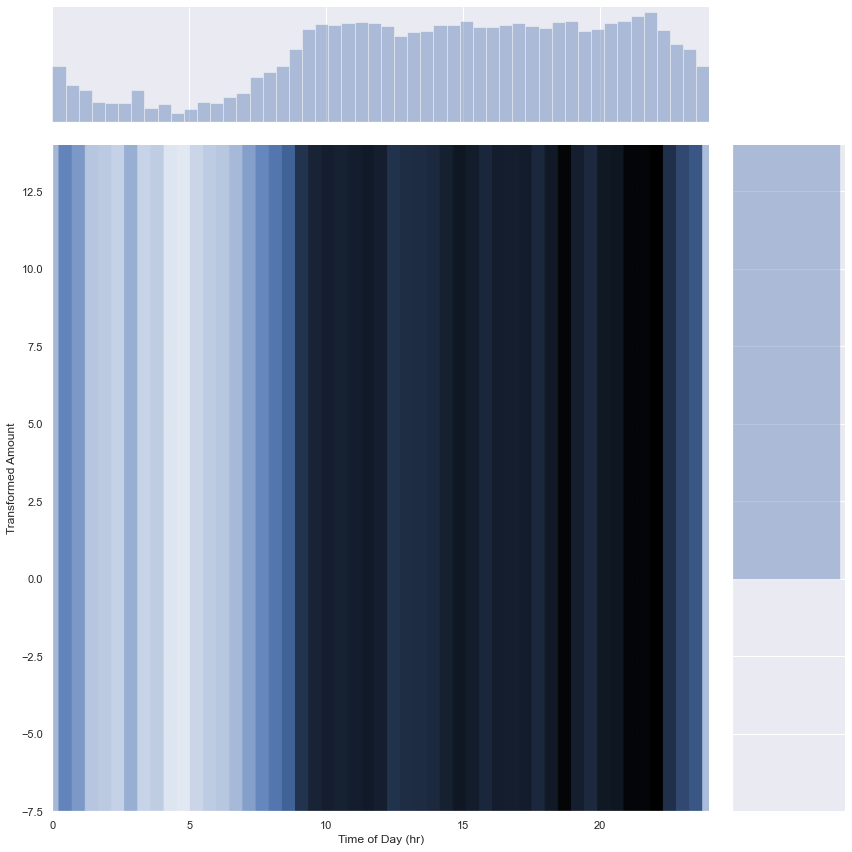

In [21]:
sns.jointplot(df['Time'].apply(lambda x: x % 24), df['Amount'], kind='hex', stat_func=None, size=12, xlim=(0,24), ylim=(-7.5,14)).set_axis_labels('Time of Day (hr)','Transformed Amount')

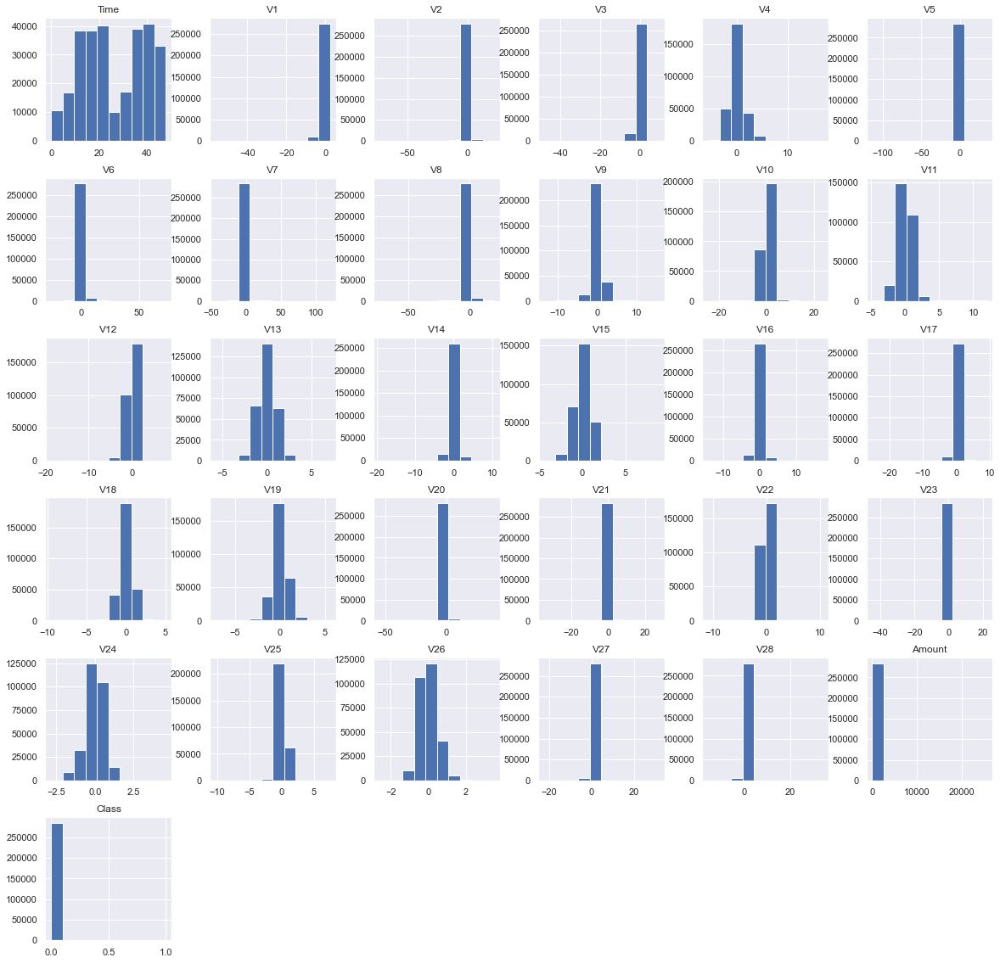

In [22]:
df.hist(figsize = (20, 20))
plt.show()

In [23]:
# 

# std_scaler = StandardScaler()
# rob_scaler = RobustScaler()

# df['scaled_amount'] = rob_scaler.fit_transform(df['Amount'].values.reshape(-1,1))
# df['scaled_time'] = rob_scaler.fit_transform(df['Time'].values.reshape(-1,1))

# df.drop(['Time','Amount'], axis=1, inplace=True)
# df.head()

In [24]:
# Since our classes are highly skewed we should make them equivalent in order to have a normal distribution of the classes.

# Lets shuffle the data before creating the subsamples

df = df.sample(frac=1)

# amount of fraud classes 492 rows.
fraud_df = df.loc[df['Class'] == 1]
non_fraud_df = df.loc[df['Class'] == 0][:394]

normal_distributed_df = pd.concat([fraud_df, non_fraud_df])

# Shuffle dataframe rows
new_df = normal_distributed_df.sample(frac=1, random_state=42)

new_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
189937,12.370,-0.235,0.355,1.972,-1.256,-0.681,-0.666,0.059,-0.003,1.122,...,0.221,0.912,-0.286,0.451,1.883e-01,-0.532,0.123,0.040,1.00,1
181016,23.851,-3.365,2.929,-5.661,3.891,-1.840,-1.801,-5.559,2.402,-2.849,...,0.875,-0.103,-0.606,-0.743,9.632e-02,-0.135,1.239,0.100,1.00,1
37300,19.770,-0.426,0.512,1.598,-0.496,-0.053,-0.313,0.415,0.157,-0.316,...,0.119,0.174,-0.125,-0.003,-8.394e-04,0.203,-0.040,-0.006,31.90,0
24481,0.582,1.229,-0.665,0.450,-1.418,-0.929,-0.404,-0.569,-0.056,1.892,...,0.098,0.469,-0.263,-0.347,6.010e-01,0.158,0.039,0.026,56.75,0
94916,2.942,1.209,-0.142,0.167,0.155,-0.269,-0.434,-0.163,-0.153,1.782,...,-0.511,-1.465,0.040,-0.694,8.065e-02,0.494,-0.108,0.008,75.00,0


In [25]:
new_df.shape

(886, 31)

<AxesSubplot:xlabel='Class', ylabel='count'>

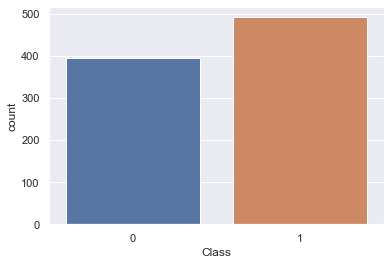

In [26]:
sns.countplot('Class', data=new_df)

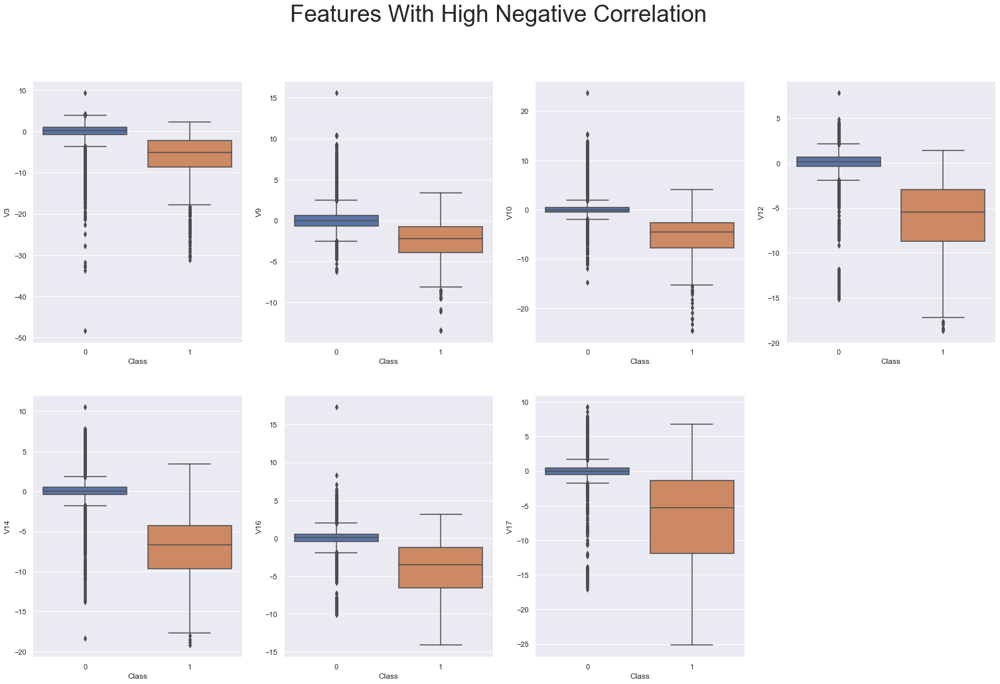

In [27]:
#visualizing the features w high negative correlation
f, axes = plt.subplots(nrows=2, ncols=4, figsize=(26,16))

f.suptitle('Features With High Negative Correlation', size=35)
sns.boxplot(x="Class", y="V3", data=df, ax=axes[0,0])
sns.boxplot(x="Class", y="V9", data=df, ax=axes[0,1])
sns.boxplot(x="Class", y="V10", data=df, ax=axes[0,2])
sns.boxplot(x="Class", y="V12", data=df, ax=axes[0,3])
sns.boxplot(x="Class", y="V14", data=df, ax=axes[1,0])
sns.boxplot(x="Class", y="V16", data=df, ax=axes[1,1])
sns.boxplot(x="Class", y="V17", data=df, ax=axes[1,2])
f.delaxes(axes[1,3])

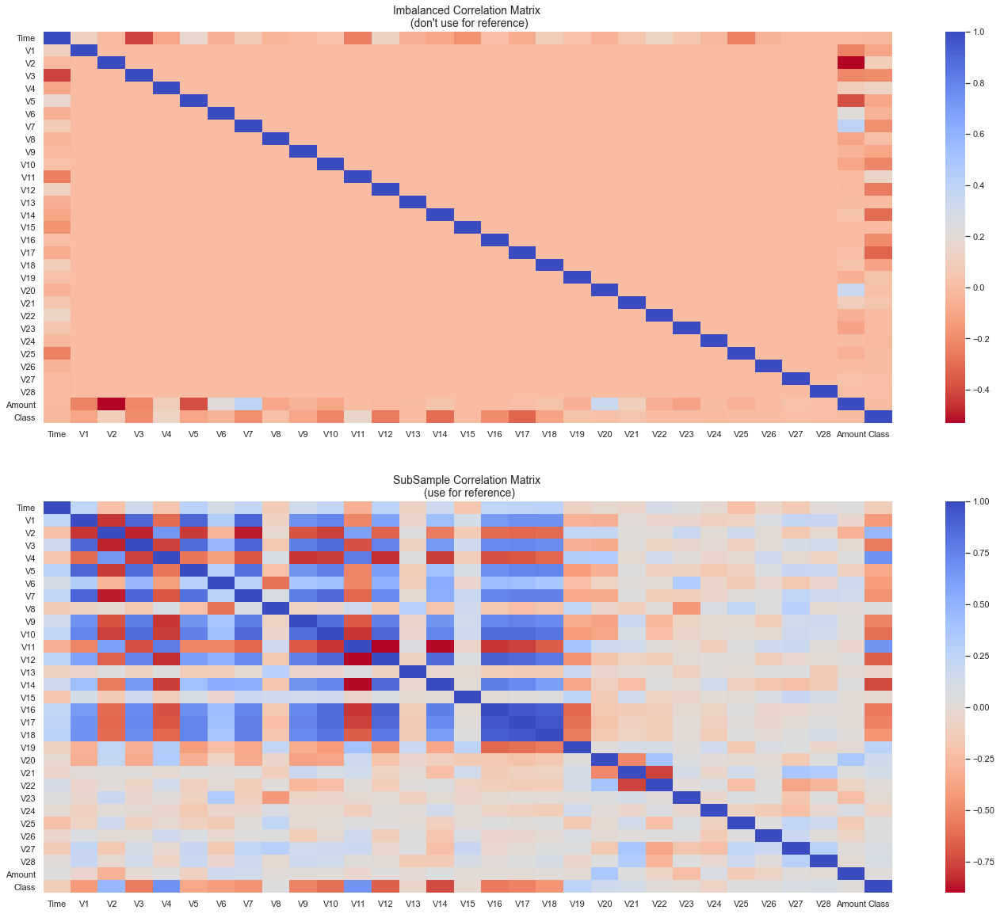

In [28]:

f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24,20))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)


sub_sample_corr = new_df.corr()
sns.heatmap(sub_sample_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax2)
ax2.set_title('SubSample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

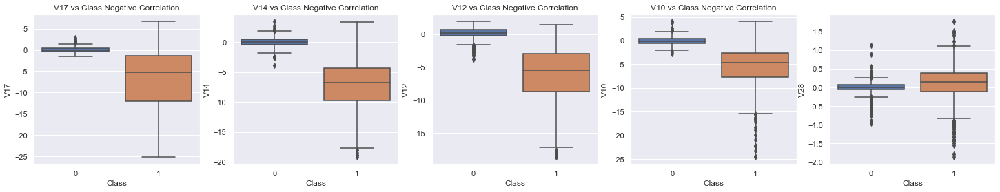

In [29]:
f, axes = plt.subplots(ncols=5, figsize=(25,4))

# Negative Correlations with our Class (The lower our feature value the more likely it will be a fraud transaction)
sns.boxplot(x="Class", y="V17", data=new_df, ax=axes[0])
axes[0].set_title('V17 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V14", data=new_df, ax=axes[1])
axes[1].set_title('V14 vs Class Negative Correlation')


sns.boxplot(x="Class", y="V12", data=new_df, ax=axes[2])
axes[2].set_title('V12 vs Class Negative Correlation')


sns.boxplot(x="Class", y="V10", data=new_df, ax=axes[3])
axes[3].set_title('V10 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V28", data=new_df, ax=axes[4])
axes[3].set_title('V10 vs Class Negative Correlation')

plt.show()

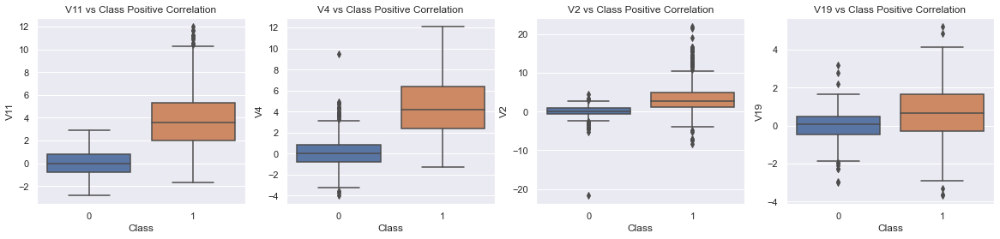

In [30]:
f, axes = plt.subplots(ncols=4, figsize=(20,4))

# Positive correlations (The higher the feature the probability increases that it will be a fraud transaction)
sns.boxplot(x="Class", y="V11", data=new_df, ax=axes[0])
axes[0].set_title('V11 vs Class Positive Correlation')

sns.boxplot(x="Class", y="V4", data=new_df, ax=axes[1])
axes[1].set_title('V4 vs Class Positive Correlation')


sns.boxplot(x="Class", y="V2", data=new_df, ax=axes[2])
axes[2].set_title('V2 vs Class Positive Correlation')


sns.boxplot(x="Class", y="V19", data=new_df, ax=axes[3])
axes[3].set_title('V19 vs Class Positive Correlation')

plt.show()

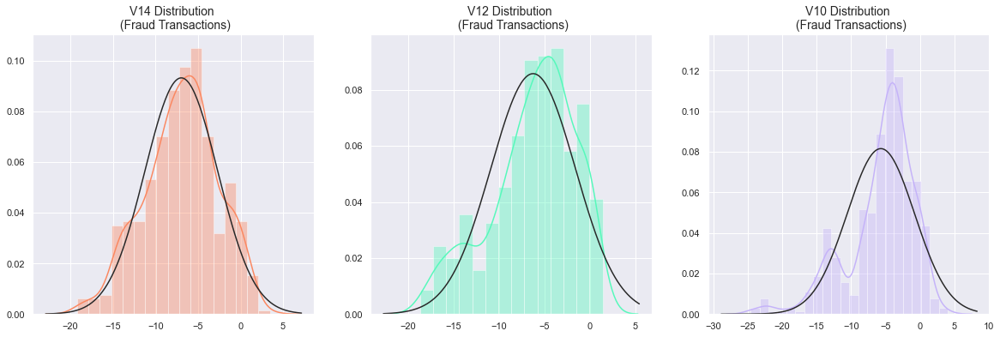

In [31]:
from scipy.stats import norm

f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20, 6))

v14_fraud_dist = new_df['V14'].loc[new_df['Class'] == 1].values
sns.distplot(v14_fraud_dist,ax=ax1, fit=norm, color='#FB8861')
ax1.set_title('V14 Distribution \n (Fraud Transactions)', fontsize=14)

v12_fraud_dist = new_df['V12'].loc[new_df['Class'] == 1].values
sns.distplot(v12_fraud_dist,ax=ax2, fit=norm, color='#56F9BB')
ax2.set_title('V12 Distribution \n (Fraud Transactions)', fontsize=14)


v10_fraud_dist = new_df['V10'].loc[new_df['Class'] == 1].values
sns.distplot(v10_fraud_dist,ax=ax3, fit=norm, color='#C5B3F9')
ax3.set_title('V10 Distribution \n (Fraud Transactions)', fontsize=14)

plt.show()

In [32]:
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df_train['scaled_amount'] = rob_scaler.fit_transform(df_train['Amount'].values.reshape(-1,1))
df_train['scaled_time'] = rob_scaler.fit_transform(df_train['Time'].values.reshape(-1,1))

df_test['scaled_amount'] = rob_scaler.fit_transform(df_test['Amount'].values.reshape(-1,1))
df_test['scaled_time'] = rob_scaler.fit_transform(df_test['Time'].values.reshape(-1,1))

new_df['scaled_amount'] = rob_scaler.fit_transform(new_df['Amount'].values.reshape(-1,1))
new_df['scaled_time'] = rob_scaler.fit_transform(new_df['Time'].values.reshape(-1,1))

df_train.drop(['Time','Amount'], axis=1, inplace=True)
df_train.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
0,1.044,0.319,1.046,2.806,-0.561,-0.368,0.033,-0.042,-0.323,0.499,...,-0.680,0.085,0.685,0.319,-0.205,0.002,0.038,0,0.387,-0.543
1,-1.665,0.808,1.806,1.903,-0.822,0.935,-0.825,0.976,1.747,-0.659,...,-0.511,0.036,0.148,-0.529,-0.567,-0.596,-0.220,0,-0.071,-0.729
2,-0.324,0.602,0.865,-2.138,0.295,-1.252,1.072,-0.335,1.071,-1.110,...,0.353,-0.342,-0.146,0.094,-0.804,0.229,-0.022,0,-0.294,-0.965
3,-0.258,1.218,-0.585,-0.875,1.222,-0.311,1.074,-0.161,0.201,0.154,...,-0.781,0.019,0.179,-0.316,0.097,0.270,-0.021,0,-0.157,0.025
4,2.142,-0.495,-1.937,-0.818,-0.025,-1.027,-0.152,-0.306,-0.869,0.429,...,0.022,0.079,-0.481,0.024,-0.279,-0.030,-0.044,0,0.251,0.500


In [33]:
df_test.drop(['Time','Amount'], axis=1, inplace=True)
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.115,0.796,-0.150,-0.823,0.879,-0.553,0.939,-0.109,0.111,-0.391,...,-0.336,-0.808,-0.056,-1.025,-0.370,0.205,0.243,0.086,-0.292,0.328
1,-0.039,0.496,-0.811,0.547,1.986,4.386,-1.345,-1.744,-0.563,-0.616,...,-1.377,-0.072,-0.198,1.015,1.011,-0.168,0.113,0.257,0.878,-0.689
2,2.276,-1.532,-1.022,-1.602,-1.220,-0.462,-1.196,-0.147,-0.950,1.560,...,-0.193,-0.104,0.151,-0.811,-0.198,-0.128,0.014,-0.051,0.289,0.875
3,1.940,-0.358,-1.211,0.383,0.051,-0.171,-0.109,-0.002,0.869,-0.002,...,0.158,0.650,0.034,0.740,0.224,-0.196,-0.013,-0.057,0.113,0.616
4,1.081,-0.503,1.076,-0.543,-1.473,-1.065,-0.443,-0.143,1.660,-1.131,...,0.224,0.821,-0.137,0.986,0.563,-0.574,0.090,0.052,0.641,-0.257


In [34]:
y = df_train.pop('Class')
x = df_train

In [35]:
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.115,0.796,-0.150,-0.823,0.879,-0.553,0.939,-0.109,0.111,-0.391,...,-0.336,-0.808,-0.056,-1.025,-0.370,0.205,0.243,0.086,-0.292,0.328
1,-0.039,0.496,-0.811,0.547,1.986,4.386,-1.345,-1.744,-0.563,-0.616,...,-1.377,-0.072,-0.198,1.015,1.011,-0.168,0.113,0.257,0.878,-0.689
2,2.276,-1.532,-1.022,-1.602,-1.220,-0.462,-1.196,-0.147,-0.950,1.560,...,-0.193,-0.104,0.151,-0.811,-0.198,-0.128,0.014,-0.051,0.289,0.875
3,1.940,-0.358,-1.211,0.383,0.051,-0.171,-0.109,-0.002,0.869,-0.002,...,0.158,0.650,0.034,0.740,0.224,-0.196,-0.013,-0.057,0.113,0.616
4,1.081,-0.503,1.076,-0.543,-1.473,-1.065,-0.443,-0.143,1.660,-1.131,...,0.224,0.821,-0.137,0.986,0.563,-0.574,0.090,0.052,0.641,-0.257


In [36]:
x = x.drop(['scaled_amount','scaled_time'],axis=1)
df_test = df_test.drop(['scaled_amount','scaled_time'],axis=1)

In [37]:
x

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,1.044,0.319,1.046,2.806,-0.561,-0.368,0.033,-0.042,-0.323,0.499,...,-0.721,-0.085,-0.240,-0.680,0.085,0.685,0.319,-0.205,0.002,0.038
1,-1.665,0.808,1.806,1.903,-0.822,0.935,-0.825,0.976,1.747,-0.659,...,1.326,-0.374,-0.335,-0.511,0.036,0.148,-0.529,-0.567,-0.596,-0.220
2,-0.324,0.602,0.865,-2.138,0.295,-1.252,1.072,-0.335,1.071,-1.110,...,0.096,-0.040,0.012,0.353,-0.342,-0.146,0.094,-0.804,0.229,-0.022
3,-0.258,1.218,-0.585,-0.875,1.222,-0.311,1.074,-0.161,0.201,0.154,...,0.136,0.382,-0.425,-0.781,0.019,0.179,-0.316,0.097,0.270,-0.021
4,2.142,-0.495,-1.937,-0.818,-0.025,-1.027,-0.152,-0.306,-0.869,0.429,...,1.065,0.107,0.010,0.022,0.079,-0.481,0.024,-0.279,-0.030,-0.044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227840,-1.994,1.735,-1.108,-2.672,1.605,3.042,-0.418,1.438,0.945,1.017,...,-0.575,0.776,-0.304,-0.708,0.047,1.008,0.234,0.769,0.698,0.355
227841,-0.440,1.063,1.582,-0.030,0.041,-0.904,0.730,-0.108,-0.513,-0.332,...,0.010,0.159,-0.216,-0.532,-0.025,0.383,-0.165,0.069,0.269,0.123
227842,0.828,-2.649,-3.161,0.209,-0.561,-1.570,1.613,-0.930,-1.319,0.684,...,-0.911,0.893,0.350,0.002,-0.747,0.172,0.248,0.937,-0.258,0.038
227843,-1.524,-6.287,-2.638,1.330,-1.672,1.958,1.359,0.082,0.753,-0.702,...,-1.477,3.299,1.329,0.001,-1.360,-1.508,-1.184,0.578,-0.329,0.230


In [38]:
x.shape

(227845, 28)

In [39]:
y.shape

(227845,)

In [40]:
clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(x, y)
clf.feature_importances_

array([0.00000000e+00, 6.64079693e-04, 1.64016769e-02, 1.10726952e-02,
       1.12833261e-03, 8.12053307e-06, 1.54202198e-02, 2.80607340e-03,
       5.20390042e-02, 8.13971343e-02, 9.74799949e-02, 2.41933240e-01,
       0.00000000e+00, 1.11869504e-01, 0.00000000e+00, 5.89654101e-02,
       2.45464979e-01, 5.09558577e-02, 1.16757491e-03, 6.82818632e-04,
       2.84711088e-03, 4.82174136e-04, 0.00000000e+00, 0.00000000e+00,
       1.21449817e-04, 6.36458207e-03, 1.37594009e-05, 7.14208201e-04])

In [41]:
xb = xgb.XGBRFRegressor()
xb.fit(x, y)
xb.feature_importances_

[13:31:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


array([0.00687269, 0.0076968 , 0.01050094, 0.01611375, 0.00325623,
       0.01119005, 0.01446964, 0.0103796 , 0.03653619, 0.07195353,
       0.02403417, 0.1196127 , 0.        , 0.04612156, 0.        ,
       0.00892835, 0.5283889 , 0.        , 0.00280011, 0.01193771,
       0.00858623, 0.        , 0.        , 0.        , 0.02091379,
       0.02481328, 0.01489371, 0.        ], dtype=float32)

In [42]:
def roc_curve_plots(y_test,y_predict_wrf,X_test,model):
    print(classification_report(y_test,y_predict_wrf),"\n")
    neigh_prob_linear=model.predict_proba(X_test)
    neigh_prob_linear1=neigh_prob_linear[:,1]
    fpr,tpr,thresh=roc_curve(y_test,neigh_prob_linear1)
    roc_auc_neigh=auc(fpr,tpr)

    plt.figure(dpi=80)
    plt.title("ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.plot(fpr,tpr,'b',label='AUC Score = %0.2f'%roc_auc_neigh)
    plt.plot(fpr,fpr,'r--',color='red')
    plt.legend()

In [43]:
def model_accuracies(model,x_feature,y_label,X_test,df_test_len):
    # X_train, X_test, y_train, y_test = train_test_split(x_feature, y_label, test_size=0.33, random_state=42)
    print(x_feature.shape,y_label.shape,X_test.shape)
    y_pred = model.fit(x_feature, y_label).predict(X_test)
    print("df_test_len", df_test_len)
    cm_wrf = confusion_matrix(y_pred,y_label.iloc[:df_test_len])
    print("f1_score       : ", f1_score(y_label.iloc[:df_test_len], y_pred, average="macro"))
    print("precision_score: ", precision_score(y_label.iloc[:df_test_len], y_pred, average="macro"))
    print("recall_score   : ", recall_score(y_label.iloc[:df_test_len], y_pred, average="macro"))
    print("\nAccuracy Score :",accuracy_score(y_pred,y_label.iloc[:df_test_len]))
    roc_curve_plots(y_label.iloc[:df_test_len],y_pred,X_test,model)

## Use techniques like undersampling or oversampling before running Naïve Bayes, Logistic Regression or SVM.
   * ### Oversampling or undersampling can be used to tackle the class imbalance problem
   * ### Oversampling increases the prior probability of imbalanced class and in case of other classifiers, error gets multiplied as the low-proportionate class is mimicked multiple times.

In [44]:
ros = RandomOverSampler(random_state=42)
X_ros, y_ros = ros.fit_resample(x, y)

In [45]:
print(X_ros.shape, y_ros.shape)

(454902, 28) (454902,)


In [46]:
rus = RandomUnderSampler(random_state=42)
X_rus, y_rus = rus.fit_resample(x, y)

In [47]:
print(X_rus.shape, y_rus.shape)

(788, 28) (788,)


(454902, 28) (454902,) (56962, 28)
df_test_len 56962
f1_score       :  0.49453055317909606
precision_score:  0.5000795832882818
recall_score   :  0.5011726428172394

Accuracy Score : 0.9712439872195499
              precision    recall  f1-score   support

           0       1.00      0.97      0.99     56860
           1       0.00      0.03      0.00       102

    accuracy                           0.97     56962
   macro avg       0.50      0.50      0.49     56962
weighted avg       1.00      0.97      0.98     56962
 



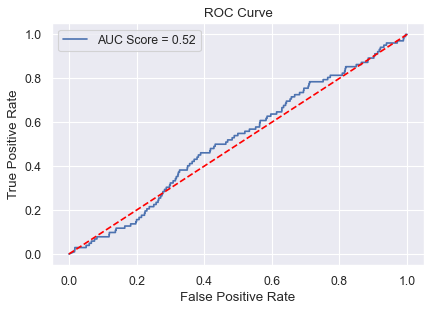

In [48]:
gnb = GaussianNB()
df_test_len = df_test.shape[0]
# print(df_test.sample(n=df_test_len))
model_accuracies(model = gnb, x_feature=X_ros,y_label= y_ros, X_test=df_test, df_test_len=df_test_len)

(454902, 28) (454902,) (56962, 28)
df_test_len 56962
f1_score       :  0.4942775108100917
precision_score:  0.49946433771292903
recall_score   :  0.49310104625740553

Accuracy Score : 0.9746673220743653
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56860
           1       0.00      0.01      0.00       102

    accuracy                           0.97     56962
   macro avg       0.50      0.49      0.49     56962
weighted avg       1.00      0.97      0.99     56962
 



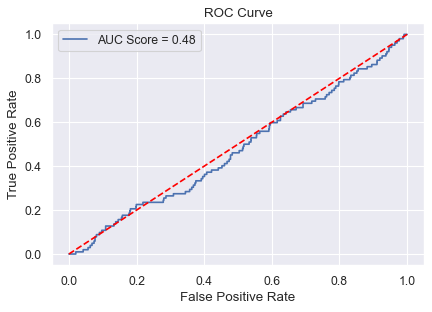

In [49]:
lr = LogisticRegression(class_weight ='balanced')
model_accuracies(model = lr, x_feature=X_ros,y_label= y_ros,X_test=df_test,df_test_len=df_test.shape[0])

(788, 28) (788,) (788, 28)
df_test_len 788
f1_score       :  0.35340099330598146
precision_score:  0.45206112814522803
recall_score   :  0.4936548223350254

Accuracy Score : 0.4936548223350254
              precision    recall  f1-score   support

           0       0.50      0.96      0.65       394
           1       0.41      0.03      0.05       394

    accuracy                           0.49       788
   macro avg       0.45      0.49      0.35       788
weighted avg       0.45      0.49      0.35       788
 



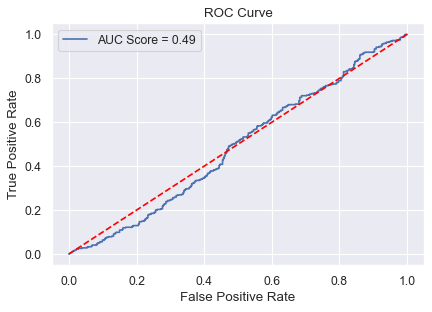

In [50]:
gnb = GaussianNB()
model_accuracies(model = gnb, x_feature=X_rus,y_label= y_rus, X_test=df_test.iloc[:788],df_test_len = 788)

(788, 28) (788,) (788, 28)
df_test_len 788
f1_score       :  0.3699581963553715
precision_score:  0.5
recall_score   :  0.5

Accuracy Score : 0.5
              precision    recall  f1-score   support

           0       0.50      0.95      0.66       394
           1       0.50      0.05      0.08       394

    accuracy                           0.50       788
   macro avg       0.50      0.50      0.37       788
weighted avg       0.50      0.50      0.37       788
 



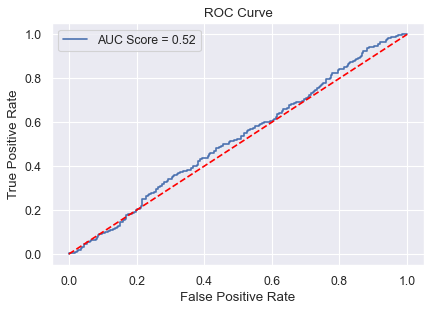

In [51]:
lr = LogisticRegression(class_weight ='balanced')
model_accuracies(model = lr, x_feature=X_rus,y_label= y_rus, X_test=df_test.iloc[:788],df_test_len = 788)

## Following are the matrices for evaluating the model performance: Precision, Recall, F1-Score, AUC-ROC curve. Use F1-Score as the evaluation criteria for this project.

* Accuracy can be used when the class distribution is similar while F1-score is a better metric when there are imbalanced classes as in the above case.
* Accuracy is used when the True Positives and True negatives are more important while F1-score is used when the False Negatives and False Positives are crucial

* F1 score for undersampled data for Model Logistic Regression and Nave bayes is more.

### * Try out models like Naive Bayes, Logistic Regression or SVM. Find out which one performs the best

In [52]:
def run_parllel_job_cross_val(pipeline,x,y):
    big_future_x = client.scatter(x)
    big_future_y = client.scatter(y)
    a = client.submit(cross_val_score,pipeline, big_future_x, big_future_y, cv=5, scoring='f1', n_jobs=5)
    return a.result().mean()

In [53]:
pipe_lr = Pipeline(steps=[('scaler', StandardScaler()), ('lr', LogisticRegression())])
output = run_parllel_job_cross_val(pipe_lr,x,y)
output

0.7333977375000338

In [54]:
pipe_svc = Pipeline(steps=[('scaler', StandardScaler()), ('svc', SVC())])
output = run_parllel_job_cross_val(pipe_svc,x,y)
output

0.7736833523239918

In [55]:
pipe_nb = Pipeline(steps=[('nb', GaussianNB())])
output = run_parllel_job_cross_val(pipe_nb,x,y)
output

0.11600483849746838

In [56]:
# scoring = 'f1'
# models = []
# results = []
# names = []
# models.append(('SVM', SVC()))
# models.append(('LR', LogisticRegression()))
# models.append(('LDA', LinearDiscriminantAnalysis()))
# models.append(('KNN', KNeighborsClassifier()))
# models.append(('CART', DecisionTreeClassifier()))
# models.append(('NB', GaussianNB()))

# for name, model in models:
#     start_time = time.time()
#     kfold = KFold(n_splits=10, random_state=42, shuffle=True)
#     cv_results = cross_val_score(model, x, y, cv=kfold, scoring=scoring)
#     elapsed_time = time.time() - start_time
#     results.append(cv_results)
#     names.append(name)
#     msg = "{:3.2f} ({:3.2f})  Time elapsed: {:6.2f}".format(cv_results.mean(), cv_results.std(), elapsed_time)
#     msg = "%s "%(name) + msg
#     print(msg)

In [57]:
# pipe = Pipeline([('scaler', StandardScaler()),('classifier', RandomForestClassifier())])
# estimators_range  =range(5,20)
# # Create space of candidate learning algorithms and their hyperparameters
# search_space = [{
#                      'scaler':[StandardScaler(),MinMaxScaler(), Normalizer(), MaxAbsScaler()],
#                      'classifier': [LogisticRegression()],
#                      'classifier__penalty' : ['l2'],'classifier__dual':[False], 'classifier__solver':['newton-cg', 'saga'],
#                      'classifier__C': np.logspace(0, 4, 10)
#                 },
#                 {
#                      'scaler':[StandardScaler(),MinMaxScaler(), Normalizer(), MaxAbsScaler()],
#                      'classifier': [RandomForestClassifier()],
#                      'classifier__n_estimators': [10,100,200],'classifier__criterion':['gini', 'entropy'],
#                      'classifier__max_features': [1, 2, 3]
#                 },
#                 {
#                      'scaler':[StandardScaler(),MinMaxScaler(), Normalizer(), MaxAbsScaler()],
#                      'classifier': [xgb.XGBRFRegressor()],
#                      'classifier__learning_rate ': [0.1],
#                      'classifier__max_depth' : [5], 'classifier__n_estimators' : estimators_range, 'classifier__booster':['gbtree'], 'classifier__verbosity' : [0]
#                 },
#                 {
#                     'scaler':[StandardScaler(),MinMaxScaler(), Normalizer(), MaxAbsScaler()],
#                     'classifier': [GaussianNB()],
#                 },
#                ]

In [58]:
# clf = GridSearchCV(pipe, search_space, cv=5, verbose=0, n_jobs=5)
# best_model = clf.fit(x, y)

# print("best_score_ :",best_model.best_score_,"\n")
# best_model.best_estimator_.get_params()

### * Ensemble Learning

#### RandomForest

In [59]:
wrf = RandomForestClassifier(class_weight='balanced_subsample', random_state=42, n_jobs=5)
wrf.fit(x, y)

RandomForestClassifier(class_weight='balanced_subsample', n_jobs=5,
                       random_state=42)

Accuracy Score : 0.9969979986657772


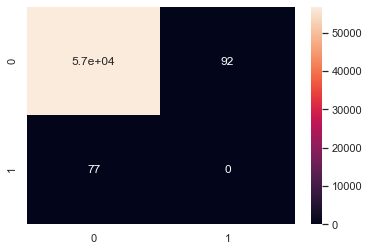

In [60]:
y_predict_wrf = wrf.predict(df_test)
cm_wrf = confusion_matrix(y_predict_wrf,y.sample(n = 56962))
sns.heatmap(cm_wrf,annot=True)
print("Accuracy Score :",accuracy_score(y_predict_wrf,y.sample(n = 56962)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       0.00      0.00      0.00        99

    accuracy                           1.00     56962
   macro avg       0.50      0.50      0.50     56962
weighted avg       1.00      1.00      1.00     56962
 



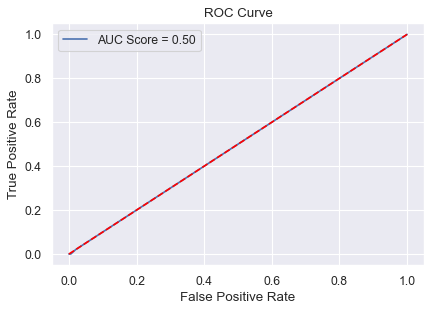

In [61]:
roc_curve_plots(y.sample(n = 56962),y_predict_wrf,df_test,wrf)

In [62]:
y_label = y.iloc[:df_test_len]

In [63]:
print("f1_score       : ", f1_score(y_label, y_predict_wrf, average="macro"))
print("precision_score: ", precision_score(y_label, y_predict_wrf, average="macro"))
print("recall_score   : ", recall_score(y_label, y_predict_wrf, average="macro"))

f1_score       :  0.4992131522264715
precision_score:  0.49910345433769887
recall_score   :  0.49932289834681676


#### XGBoost
##### * Suppose, the dataset has 90 observations of negative class and 10 observations of positive class, then ideal value of scale_pos_weight should be 9.

In [64]:
y.value_counts(normalize=True) * 100

0    99.827
1     0.173
Name: Class, dtype: float64

In [65]:
xb = xgb.XGBClassifier(learning_rate=0.001, max_depth=1, n_estimators=1, scale_pos_weight=99.827, n_jobs=5)

In [66]:
xb.fit(x, y,eval_metric='logloss',verbose=True)

XGBClassifier(learning_rate=0.001, max_depth=1, n_estimators=1, n_jobs=5,
              scale_pos_weight=99.827)

Accuracy Score : 0.9935395526842457
f1_score       :  0.5009670259987318


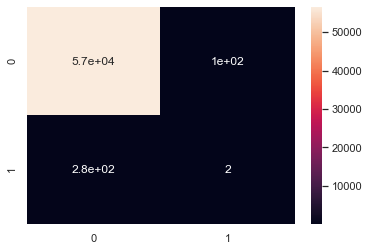

In [67]:
xgb_predict=xb.predict(df_test)
cm_xgb = confusion_matrix(xgb_predict,y.sample(n = 56962))
sns.heatmap(cm_xgb,annot=True)
print("Accuracy Score :",accuracy_score(xgb_predict,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), xgb_predict, average="macro"))

#### BaggingClassifier

Accuracy Score : 0.997559776693234
f1_score       :  0.4992967898456454


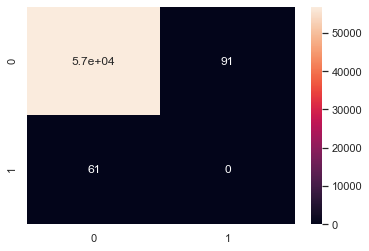

In [68]:
BC_clf = BaggingClassifier(base_estimator=SVC(),
                        n_estimators=10, random_state=0, n_jobs=5).fit(x, y)
BC_pred = BC_clf.predict(df_test)
cm_bc = confusion_matrix(BC_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_pred, average="macro"))

Accuracy Score : 0.9969277764123451
f1_score       :  0.4992703809841946


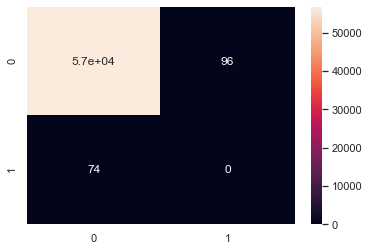

In [69]:
BC_RFC = BaggingClassifier(base_estimator=RandomForestClassifier(class_weight='balanced_subsample'),
                        n_estimators=10, random_state=0, n_jobs=5).fit(x, y)
BC_rfc_pred = BC_RFC.predict(df_test)
cm_BC_rf = confusion_matrix(BC_rfc_pred,y.sample(n = 56962))
sns.heatmap(cm_BC_rf,annot=True)
print("Accuracy Score :",accuracy_score(BC_rfc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_rfc_pred, average="macro"))

#### GradientBoostingClassifier

Accuracy Score : 0.9971033320459254
f1_score       :  0.4992615774113014


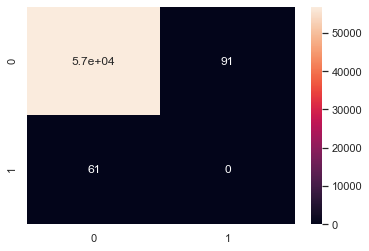

In [70]:
GBC = GradientBoostingClassifier(random_state=0, loss='deviance', learning_rate=0.01, criterion='mse')
GBC.fit(x, y)
BC_gbc_pred = GBC.predict(df_test)
cm_gbc = confusion_matrix(BC_gbc_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_gbc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_gbc_pred, average="macro"))

#### ExtraTreesClassifier

Accuracy Score : 0.996892665285629
f1_score       :  0.4992439693368029


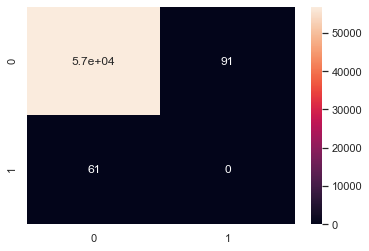

In [71]:
GBC = ExtraTreesClassifier(n_estimators=100, random_state=0, class_weight='balanced', n_jobs = 6)
GBC.fit(x, y)
BC_gbc_pred = GBC.predict(df_test)
cm_gbc = confusion_matrix(BC_gbc_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_gbc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_gbc_pred, average="macro"))

#### AdaBoostClassifier

Accuracy Score : 0.9968399985955549
f1_score       :  0.49924837147152157


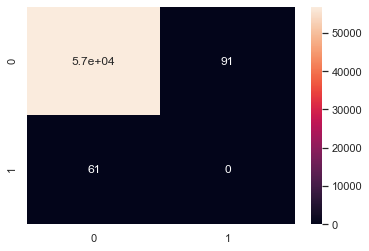

In [72]:
GBC = AdaBoostClassifier(n_estimators=100, random_state=0)
GBC.fit(x, y)
BC_gbc_pred = GBC.predict(df_test)
cm_gbc = confusion_matrix(BC_gbc_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_gbc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_gbc_pred, average="macro"))

### ANN

In [73]:
new_df.drop(['Time','Amount'], axis=1, inplace=True)
new_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
189937,-0.235,0.355,1.972,-1.256,-0.681,-0.666,0.059,-0.003,1.122,-1.481,...,0.912,-0.286,0.451,1.883e-01,-0.532,0.123,0.040,1,-0.172,-0.372
181016,-3.365,2.929,-5.661,3.891,-1.840,-1.801,-5.559,2.402,-2.849,-5.996,...,-0.103,-0.606,-0.743,9.632e-02,-0.135,1.239,0.100,1,-0.172,0.088
37300,-0.426,0.512,1.598,-0.496,-0.053,-0.313,0.415,0.157,-0.316,-0.512,...,0.174,-0.125,-0.003,-8.394e-04,0.203,-0.040,-0.006,0,0.141,-0.075
24481,1.229,-0.665,0.450,-1.418,-0.929,-0.404,-0.569,-0.056,1.892,-1.202,...,0.469,-0.263,-0.347,6.010e-01,0.158,0.039,0.026,0,0.393,-0.845
94916,1.209,-0.142,0.167,0.155,-0.269,-0.434,-0.163,-0.153,1.782,-0.559,...,-1.465,0.040,-0.694,8.065e-02,0.494,-0.108,0.008,0,0.578,-0.750


In [74]:
new_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
189937,-0.235,0.355,1.972,-1.256,-0.681,-0.666,0.059,-0.003,1.122,-1.481,...,0.912,-0.286,0.451,1.883e-01,-0.532,0.123,0.040,1,-0.172,-0.372
181016,-3.365,2.929,-5.661,3.891,-1.840,-1.801,-5.559,2.402,-2.849,-5.996,...,-0.103,-0.606,-0.743,9.632e-02,-0.135,1.239,0.100,1,-0.172,0.088
37300,-0.426,0.512,1.598,-0.496,-0.053,-0.313,0.415,0.157,-0.316,-0.512,...,0.174,-0.125,-0.003,-8.394e-04,0.203,-0.040,-0.006,0,0.141,-0.075
24481,1.229,-0.665,0.450,-1.418,-0.929,-0.404,-0.569,-0.056,1.892,-1.202,...,0.469,-0.263,-0.347,6.010e-01,0.158,0.039,0.026,0,0.393,-0.845
94916,1.209,-0.142,0.167,0.155,-0.269,-0.434,-0.163,-0.153,1.782,-0.559,...,-1.465,0.040,-0.694,8.065e-02,0.494,-0.108,0.008,0,0.578,-0.750


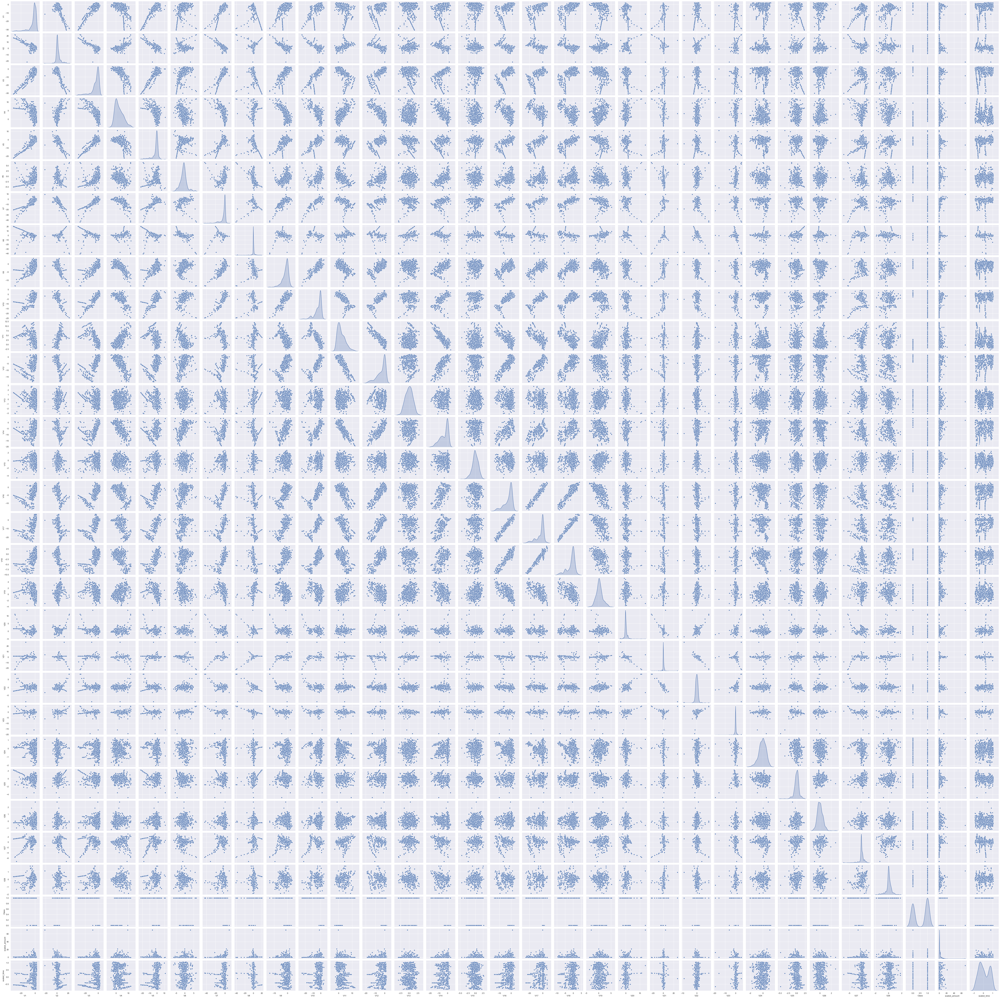

In [75]:
sns.pairplot(new_df, diag_kind="kde")

In [76]:
new_df.shape

(886, 31)

In [77]:
y_label = new_df.pop('Class')
x_feat = new_df

In [78]:
y_label.head()

189937    1
181016    1
37300     0
24481     0
94916     0
Name: Class, dtype: int64

In [79]:
x_feat.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
189937,-0.235,0.355,1.972,-1.256,-0.681,-0.666,0.059,-0.003,1.122,-1.481,...,0.221,0.912,-0.286,0.451,1.883e-01,-0.532,0.123,0.040,-0.172,-0.372
181016,-3.365,2.929,-5.661,3.891,-1.840,-1.801,-5.559,2.402,-2.849,-5.996,...,0.875,-0.103,-0.606,-0.743,9.632e-02,-0.135,1.239,0.100,-0.172,0.088
37300,-0.426,0.512,1.598,-0.496,-0.053,-0.313,0.415,0.157,-0.316,-0.512,...,0.119,0.174,-0.125,-0.003,-8.394e-04,0.203,-0.040,-0.006,0.141,-0.075
24481,1.229,-0.665,0.450,-1.418,-0.929,-0.404,-0.569,-0.056,1.892,-1.202,...,0.098,0.469,-0.263,-0.347,6.010e-01,0.158,0.039,0.026,0.393,-0.845
94916,1.209,-0.142,0.167,0.155,-0.269,-0.434,-0.163,-0.153,1.782,-0.559,...,-0.511,-1.465,0.040,-0.694,8.065e-02,0.494,-0.108,0.008,0.578,-0.750


In [80]:
x_train, x_test, y_train, y_test = train_test_split(x_feat, y_label, test_size=0.30, random_state=42, shuffle=True)

In [81]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((620, 30), (266, 30), (620,), (266,))

#### a)    Fine-tune number of layers
#### b)    Number of Neurons in each layers

#### Sigmoid is used for binary classification neural network. Because it exists between (0 to 1). Therefore, it is especially used for models where we have to predict the probability as an output. Since probability of anything exists only between the range of 0 and 1, sigmoid is the right choice. The function is differentiable.

#### ReLU stands for Rectified Linear Unit. The main advantage of using the ReLU function over other activation functions is that it does not activate all the neurons at the same time. ReLU provides just enough non-linearity so that it is nearly as simple as a linear activation, but this non-linearity opens the door for extremely complex representations. Because unlike in the linear case, the more you stack non-linear ReLUs, the more it becomes non-linear.

In [82]:
def create_model(optimizer='Adam',learn_rate=0.01, dropout_rate=0.2):
    model = Sequential()
    model.add(Dense(units =256,activation='relu',input_shape=(30,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(Dense(units=256,kernel_initializer='normal',activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=128,kernel_initializer='normal',activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=64,kernel_initializer='normal',activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=32,kernel_initializer='normal',activation='relu'))
    model.add(Dense(units=16,kernel_initializer='normal',activation='relu'))
    model.add(Dense(units=1,activation='sigmoid'))
#     if not optimizer:
#         optimizer = tf.keras.optimizers.Adam(lr=learn_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy',tf.keras.metrics.AUC()])
    return model

create_model().summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               7936      
_________________________________________________________________
batch_normalization (BatchNo (None, 256)               1024      
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8

In [83]:
# tf.keras.metrics.AUC(),tf.keras.metrics.Precision(),tf.keras.metrics.Recall()
adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
create_model().compile(optimizer=adam_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [84]:
# print(os.getcwd())
logdir="logs/fit/"+ datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)
history = create_model().fit(x_train,y_train,epochs=20,batch_size=45,validation_data=(x_test, y_test))

Train on 620 samples, validate on 266 samples
Epoch 1/20
620/620 [==============================] - 1s 2ms/sample - loss: 0.6147 - accuracy: 0.8242 - auc_2: 0.9225 - val_loss: 0.3690 - val_accuracy: 0.7143 - val_auc_2: 0.9853
Epoch 2/20
620/620 [==============================] - 0s 110us/sample - loss: 0.2899 - accuracy: 0.9274 - auc_2: 0.9482 - val_loss: 0.2641 - val_accuracy: 0.9098 - val_auc_2: 0.9866
Epoch 3/20
620/620 [==============================] - 0s 105us/sample - loss: 0.1885 - accuracy: 0.9323 - auc_2: 0.9752 - val_loss: 0.2079 - val_accuracy: 0.9361 - val_auc_2: 0.9882
Epoch 4/20
620/620 [==============================] - 0s 102us/sample - loss: 0.1613 - accuracy: 0.9339 - auc_2: 0.9815 - val_loss: 0.1754 - val_accuracy: 0.9436 - val_auc_2: 0.9881
Epoch 5/20
620/620 [==============================] - 0s 106us/sample - loss: 0.1239 - accuracy: 0.9500 - auc_2: 0.9899 - val_loss: 0.1617 - val_accuracy: 0.9474 - val_auc_2: 0.9874
Epoch 6/20
620/620 [==========================

In [85]:
df_test = pd.read_csv('Financial/test_data.csv')
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df_test['scaled_amount'] = rob_scaler.fit_transform(df_test['Amount'].values.reshape(-1,1))
df_test['scaled_time'] = rob_scaler.fit_transform(df_test['Time'].values.reshape(-1,1))

df_test.drop(['Time','Amount'], axis=1, inplace=True)
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.115,0.796,-0.150,-0.823,0.879,-0.553,0.939,-0.109,0.111,-0.391,...,-0.336,-0.808,-0.056,-1.025,-0.370,0.205,0.243,0.086,-0.292,0.328
1,-0.039,0.496,-0.811,0.547,1.986,4.386,-1.345,-1.744,-0.563,-0.616,...,-1.377,-0.072,-0.198,1.015,1.011,-0.168,0.113,0.257,0.878,-0.689
2,2.276,-1.532,-1.022,-1.602,-1.220,-0.462,-1.196,-0.147,-0.950,1.560,...,-0.193,-0.104,0.151,-0.811,-0.198,-0.128,0.014,-0.051,0.289,0.875
3,1.940,-0.358,-1.211,0.383,0.051,-0.171,-0.109,-0.002,0.869,-0.002,...,0.158,0.650,0.034,0.740,0.224,-0.196,-0.013,-0.057,0.113,0.616
4,1.081,-0.503,1.076,-0.543,-1.473,-1.065,-0.443,-0.143,1.660,-1.131,...,0.224,0.821,-0.137,0.986,0.563,-0.574,0.090,0.052,0.641,-0.257


In [86]:
# df_train_hidden
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df_train_hidden['scaled_amount'] = rob_scaler.fit_transform(df_train_hidden['Amount'].values.reshape(-1,1))
df_train_hidden['scaled_time'] = rob_scaler.fit_transform(df_train_hidden['Time'].values.reshape(-1,1))

df_train_hidden.drop(['Time','Amount'], axis=1, inplace=True)
df_train_hidden.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
0,0.115,0.796,-0.150,-0.823,0.879,-0.553,0.939,-0.109,0.111,-0.391,...,-0.808,-0.056,-1.025,-0.370,0.205,0.243,0.086,0,-0.292,0.328
1,-0.039,0.496,-0.811,0.547,1.986,4.386,-1.345,-1.744,-0.563,-0.616,...,-0.072,-0.198,1.015,1.011,-0.168,0.113,0.257,0,0.878,-0.689
2,2.276,-1.532,-1.022,-1.602,-1.220,-0.462,-1.196,-0.147,-0.950,1.560,...,-0.104,0.151,-0.811,-0.198,-0.128,0.014,-0.051,0,0.289,0.875
3,1.940,-0.358,-1.211,0.383,0.051,-0.171,-0.109,-0.002,0.869,-0.002,...,0.650,0.034,0.740,0.224,-0.196,-0.013,-0.057,0,0.113,0.616
4,1.081,-0.503,1.076,-0.543,-1.473,-1.065,-0.443,-0.143,1.660,-1.131,...,0.821,-0.137,0.986,0.563,-0.574,0.090,0.052,0,0.641,-0.257


### Predictions

In [87]:
ann_predictions = create_model().predict(df_test)

In [88]:
df_train_hidden_pred = df_train_hidden.drop(['Class'], axis=1)
ann_predictions_hidden = create_model().predict(df_train_hidden_pred)

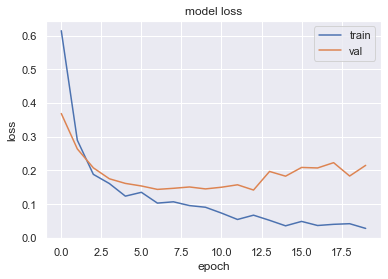

In [89]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

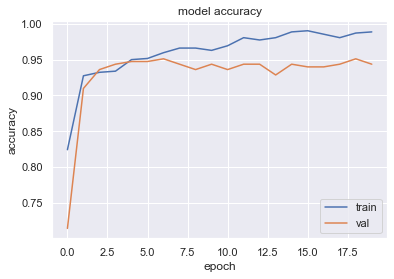

In [90]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.show()

In [91]:
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.115,0.796,-0.150,-0.823,0.879,-0.553,0.939,-0.109,0.111,-0.391,...,-0.336,-0.808,-0.056,-1.025,-0.370,0.205,0.243,0.086,-0.292,0.328
1,-0.039,0.496,-0.811,0.547,1.986,4.386,-1.345,-1.744,-0.563,-0.616,...,-1.377,-0.072,-0.198,1.015,1.011,-0.168,0.113,0.257,0.878,-0.689
2,2.276,-1.532,-1.022,-1.602,-1.220,-0.462,-1.196,-0.147,-0.950,1.560,...,-0.193,-0.104,0.151,-0.811,-0.198,-0.128,0.014,-0.051,0.289,0.875
3,1.940,-0.358,-1.211,0.383,0.051,-0.171,-0.109,-0.002,0.869,-0.002,...,0.158,0.650,0.034,0.740,0.224,-0.196,-0.013,-0.057,0.113,0.616
4,1.081,-0.503,1.076,-0.543,-1.473,-1.065,-0.443,-0.143,1.660,-1.131,...,0.224,0.821,-0.137,0.986,0.563,-0.574,0.090,0.052,0.641,-0.257


### RanomSearch
#### In Random Search, we create a grid of hyperparameters and train/test our model on just some random combination of these hyperparameters.

In [92]:
sklearn_model = KerasClassifier(build_fn=create_model, epochs=30)
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]
learn_rate = [0.01, 0.02, 0.2]
dropout_rate = [0.0, 0.1, 0.2, 0.4]
param_grid = dict(batch_size=batch_size, epochs=epochs,learn_rate=learn_rate, dropout_rate=dropout_rate)

In [93]:
grid = RandomizedSearchCV(estimator=sklearn_model, param_distributions =param_grid, n_jobs=2, cv=3)
grid_result = grid.fit(x_train,y_train,validation_data=(x_test, y_test))
print("\nBest: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("\n%f (%f) with: %r" % (mean, stdev, param))

Train on 620 samples, validate on 266 samples
Epoch 1/10
620/620 [==============================] - 1s 2ms/sample - loss: 0.4140 - accuracy: 0.8419 - auc_5: 0.9176 - val_loss: 0.1594 - val_accuracy: 0.9436 - val_auc_5: 0.9876
Epoch 2/10
620/620 [==============================] - 0s 262us/sample - loss: 0.2066 - accuracy: 0.9403 - auc_5: 0.9662 - val_loss: 0.1854 - val_accuracy: 0.9436 - val_auc_5: 0.9878
Epoch 3/10
620/620 [==============================] - 0s 290us/sample - loss: 0.2015 - accuracy: 0.9355 - auc_5: 0.9679 - val_loss: 0.1591 - val_accuracy: 0.9398 - val_auc_5: 0.9864
Epoch 4/10
620/620 [==============================] - 0s 260us/sample - loss: 0.1545 - accuracy: 0.9435 - auc_5: 0.9804 - val_loss: 0.1340 - val_accuracy: 0.9474 - val_auc_5: 0.9893
Epoch 5/10
620/620 [==============================] - 0s 263us/sample - loss: 0.2234 - accuracy: 0.9210 - auc_5: 0.9699 - val_loss: 0.1474 - val_accuracy: 0.9436 - val_auc_5: 0.9876
Epoch 6/10
620/620 [==========================

### Cross-Validation

In [94]:
scores = cross_val_score(sklearn_model, x_train, y_train, cv=5, scoring='f1')
print("f1 score is: ", scores.mean())

Train on 496 samples
Epoch 1/30
496/496 [==============================] - 1s 2ms/sample - loss: 0.6078 - accuracy: 0.7742 - auc_6: 0.8941
Epoch 2/30
496/496 [==============================] - 0s 113us/sample - loss: 0.3223 - accuracy: 0.9133 - auc_6: 0.9413
Epoch 3/30
496/496 [==============================] - 0s 113us/sample - loss: 0.2116 - accuracy: 0.9194 - auc_6: 0.9644
Epoch 4/30
496/496 [==============================] - 0s 113us/sample - loss: 0.1729 - accuracy: 0.9355 - auc_6: 0.9810
Epoch 5/30
496/496 [==============================] - 0s 111us/sample - loss: 0.1412 - accuracy: 0.9435 - auc_6: 0.9848
Epoch 6/30
496/496 [==============================] - 0s 109us/sample - loss: 0.1214 - accuracy: 0.9597 - auc_6: 0.9879
Epoch 7/30
496/496 [==============================] - 0s 107us/sample - loss: 0.1174 - accuracy: 0.9536 - auc_6: 0.9903
Epoch 8/30
496/496 [==============================] - 0s 107us/sample - loss: 0.1220 - accuracy: 0.9476 - auc_6: 0.9904
Epoch 9/30
496/496 [=

* F1 score for deep learning model is 0.9182353216277704

####  Experiment with number of epochs. Check the observations in loss and accuracy

In [95]:
grid = GridSearchCV(estimator=sklearn_model, param_grid=param_grid, n_jobs=2, cv=3)
grid_result = grid.fit(x_train,y_train,validation_data=(x_test, y_test))
print("\nBest: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("\n%f (%f) with: %r" % (mean, stdev, param))

C:\Users\Pritesh\Anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Train on 620 samples, validate on 266 samples
Epoch 1/10
620/620 [==============================] - 1s 2ms/sample - loss: 0.6138 - accuracy: 0.7984 - auc_11: 0.8918 - val_loss: 0.4239 - val_accuracy: 0.8421 - val_auc_11: 0.9794
Epoch 2/10
620/620 [==============================] - 0s 111us/sample - loss: 0.2577 - accuracy: 0.9145 - auc_11: 0.9647 - val_loss: 0.2386 - val_accuracy: 0.9098 - val_auc_11: 0.9847
Epoch 3/10
620/620 [==============================] - 0s 110us/sample - loss: 0.1890 - accuracy: 0.9210 - auc_11: 0.9750 - val_loss: 0.2047 - val_accuracy: 0.9398 - val_auc_11: 0.9857
Epoch 4/10
620/620 [==============================] - 0s 111us/sample - loss: 0.1634 - accuracy: 0.9403 - auc_11: 0.9787 - val_loss: 0.2017 - val_accuracy: 0.9549 - val_auc_11: 0.9863
Epoch 5/10
620/620 [==============================] - 0s 111us/sample - loss: 0.1310 - accuracy: 0.9500 - auc_11: 0.9882 - val_loss: 0.1684 - val_accuracy: 0.9474 - val_auc_11: 0.9855
Epoch 6/10
620/620 [================

* Best parameters are
* Best: 0.937065 using {'batch_size': 80, 'dropout_rate': 0.1, 'epochs': 50, 'learn_rate': 0.01}

#### * Play with different Learning Rate variants of Gradient Descent like Adam, SGD, RMS-prop

In [96]:
optimizers = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
param_grid = dict(optimizer=optimizers)
grid = GridSearchCV(estimator=sklearn_model, param_grid=param_grid, n_jobs=3, cv=3)
grid_result = grid.fit(x_train, y_train)
print("Best optimizers With Best score: ",grid_result.best_score_, grid_result.best_params_)

Train on 620 samples
Epoch 1/30
620/620 [==============================] - 1s 1ms/sample - loss: 0.6519 - accuracy: 0.8387 - auc_12: 0.8975
Epoch 2/30
620/620 [==============================] - 0s 100us/sample - loss: 0.3832 - accuracy: 0.9242 - auc_12: 0.9473
Epoch 3/30
620/620 [==============================] - 0s 98us/sample - loss: 0.1999 - accuracy: 0.9323 - auc_12: 0.9680
Epoch 4/30
620/620 [==============================] - 0s 98us/sample - loss: 0.1885 - accuracy: 0.9339 - auc_12: 0.9753
Epoch 5/30
620/620 [==============================] - 0s 102us/sample - loss: 0.1660 - accuracy: 0.9355 - auc_12: 0.9800
Epoch 6/30
620/620 [==============================] - 0s 98us/sample - loss: 0.1544 - accuracy: 0.9403 - auc_12: 0.9826
Epoch 7/30
620/620 [==============================] - 0s 98us/sample - loss: 0.1607 - accuracy: 0.9484 - auc_12: 0.9796
Epoch 8/30
620/620 [==============================] - 0s 98us/sample - loss: 0.1475 - accuracy: 0.9403 - auc_12: 0.9848
Epoch 9/30
620/620

### Anomaly Detection

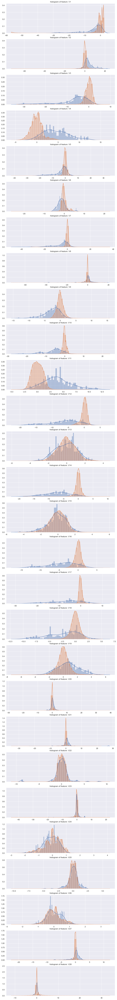

In [97]:
df_train = copy.deepcopy(df_train_original)
features = df_train.iloc[:, [x for x in range(1,29)]].columns
plt.figure(figsize=(12,28*4))

gs = gridspec.GridSpec(28, 1)
for i, c in enumerate(df_train[features]):
 ax = plt.subplot(gs[i])
 sns.distplot(df_train[c][df_train.Class == 1], bins=50)
 sns.distplot(df_train[c][df_train.Class == 0], bins=50)
 ax.set_xlabel('')
 ax.set_title('histogram of feature: ' + str(c))
plt.show()

In [98]:
Fraud = df_train[df_train['Class'] == 1]
Valid = df_train[df_train['Class'] == 0]
outlier_fraction = len(Fraud)/float(len(Valid))
print(outlier_fraction)
print('Fraud Cases: {}'.format(len(df_train[df_train['Class'] == 1])))
print('Valid Transactions: {}'.format(len(df_train[df_train['Class'] == 0])))

0.0017322412299792043
Fraud Cases: 394
Valid Transactions: 227451


In [99]:
print('Amount details of fraudulent transaction')
Fraud.Amount.describe()

Amount details of fraudulent transaction


count     394.000
mean      127.307
std       264.534
min         0.000
25%         1.000
50%        11.395
75%       106.385
max      2125.870
Name: Amount, dtype: float64

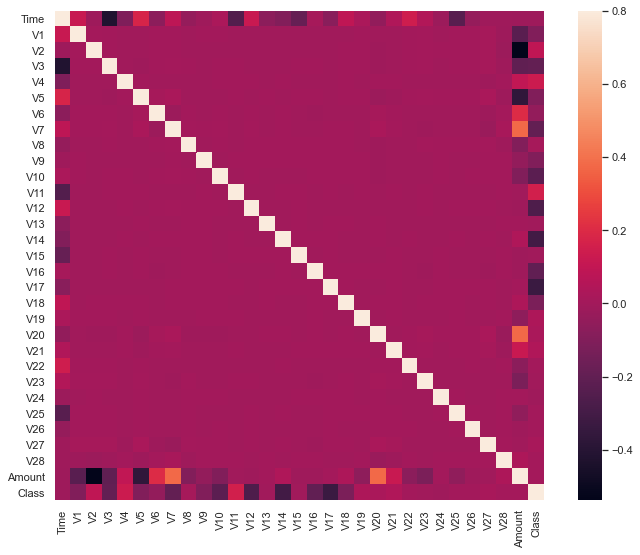

In [100]:
# Correlation matrix
corrmat = df_train.corr()
fig = plt.figure(figsize = (12, 9))
sns.heatmap(corrmat, vmax = .8, square = True)
plt.show()

#### Anomalies Detection using Isolation forest algorithm

In [101]:
y_data = df_train.pop('Class')
x_data = df_train
X_train, X_test, Y_train, Y_test = train_test_split(x_data, y_data, test_size = 0.2, random_state = 42)

In [102]:
ifc=IsolationForest(max_samples=len(X_train),contamination=outlier_fraction,random_state=1, n_jobs=4)
ifc.fit(X_train)
scores_pred = ifc.decision_function(X_train)
y_pred = ifc.predict(X_test)

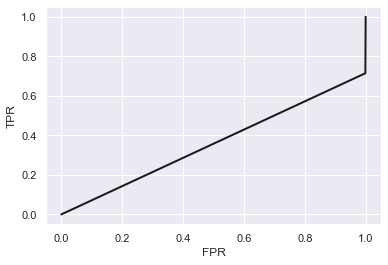

In [103]:
fpr, tpr, thresholds = roc_curve(Y_test,y_pred)
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, 'k-', lw=2)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.show()

In [104]:
# np.set_printoptions(threshold=sys.maxsize)
ifc.score_samples(X_train)

array([-0.33111238, -0.34219728, -0.33014527, ..., -0.32617074,
       -0.32454384, -0.3225194 ])

In [105]:
ifc.decision_function(X_train)

array([0.19927989, 0.18819499, 0.200247  , ..., 0.20422153, 0.20584843,
       0.20787287])

In [106]:
y_score = -ifc.decision_function(X_train)

In [107]:
from sklearn.metrics import roc_auc_score
roc_auc_score(Y_train, y_score)

0.9565597852696466

95.6% score is thresold for Anomaly Detection

In [108]:
# Reshape the prediction values to 0 for valid, 1 for fraud. 
y_pred[y_pred == 1] = 0
y_pred[y_pred == -1] = 1
n_errors = (y_pred != Y_test).sum()

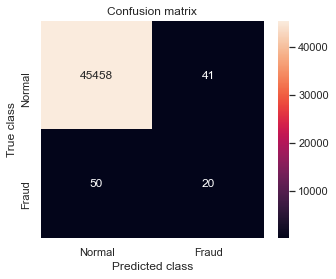

In [109]:
#printing the confusion matrix
LABELS = ['Normal', 'Fraud']
conf_matrix = confusion_matrix(Y_test, y_pred)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix, xticklabels=LABELS,
 yticklabels=LABELS, annot=True, fmt='d');
plt.title('Confusion matrix')
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

In [110]:
#evaluation of the model
#printing every score of the classifier
#scoring in any thing
from sklearn.metrics import confusion_matrix
n_outliers = len(Fraud)
print('The Model used is {}'.format('Isolation Forest'))
acc= accuracy_score(Y_test,y_pred)
print('The accuracy is {}'.format(acc))
prec= precision_score(Y_test,y_pred)
print('The precision is {}'.format(prec))
rec= recall_score(Y_test,y_pred)
print('The recall is {}'.format(rec))
f1= f1_score(Y_test,y_pred)
print('The F1-Score is {}'.format(f1))
MCC=matthews_corrcoef(Y_test,y_pred)
print('The Matthews correlation coefficient is {}'.format(MCC))

The Model used is Isolation Forest
The accuracy is 0.9980030283745529
The precision is 0.32786885245901637
The recall is 0.2857142857142857
The F1-Score is 0.30534351145038163
The Matthews correlation coefficient is 0.30507120439348184


<AxesSubplot:>

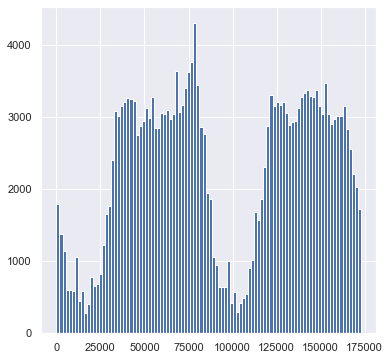

In [111]:
Valid["Time"].hist(bins=100, figsize=(6,6))

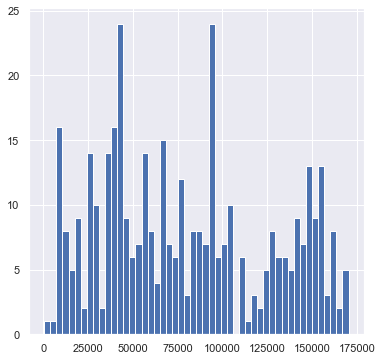

In [112]:
Fraud["Time"].hist(bins=50, figsize=(6,6));

#### Anomalies Detection using quartiles

In [113]:
for x in df_train.columns.to_list()[1:29]:
    Q1 = np.percentile(df_train[x], 25, interpolation = 'midpoint') 
    # Third quartile (Q3) 
    Q3 = np.percentile(df_train[x], 75, interpolation = 'midpoint') 
    # Interquaritle range (IQR)
    IQR = Q3 - Q1 
    # print("IQR:",IQR*1.5, "|| Q3:",Q3,"|| Q1:",Q1)
    if IQR*1.5>Q3 or IQR*1.5<Q1:
        outliers_no = ((df_train[x] < (Q1 - 1.5 * IQR)) | (df_train[x] > (Q3 + 1.5 * IQR))).sum()
        print(x," have Anomalies and total no are: ",outliers_no )
    else:
        print(x," No Anomalies")

V1  have Anomalies and total no are:  5661
V2  have Anomalies and total no are:  10877
V3  have Anomalies and total no are:  2672
V4  have Anomalies and total no are:  8872
V5  have Anomalies and total no are:  9933
V6  have Anomalies and total no are:  18386
V7  have Anomalies and total no are:  7166
V8  have Anomalies and total no are:  19338
V9  have Anomalies and total no are:  6535
V10  have Anomalies and total no are:  7597
V11  have Anomalies and total no are:  619
V12  have Anomalies and total no are:  12277
V13  have Anomalies and total no are:  2737
V14  have Anomalies and total no are:  11252
V15  have Anomalies and total no are:  2291
V16  have Anomalies and total no are:  6486
V17  have Anomalies and total no are:  5968
V18  have Anomalies and total no are:  6033
V19  have Anomalies and total no are:  8054
V20  have Anomalies and total no are:  22193
V21  have Anomalies and total no are:  11614
V22  have Anomalies and total no are:  1033
V23  have Anomalies and total no ar

## Week 4

#### Visualize the scores for Fraudulent and Non-Fraudulent transactions.

In [114]:
ann_predictions

array([[0.5008916 ],
       [0.50068694],
       [0.5001906 ],
       ...,
       [0.5005281 ],
       [0.49995697],
       [0.50735885]], dtype=float32)

In [115]:
ann_prediction_copy = [1 if x>=0.5 else 0 for x in ann_predictions]
ann_prediction_series = pd.Series(ann_prediction_copy)
ann_prediction_series

0        1
1        1
2        1
3        1
4        1
        ..
56957    1
56958    0
56959    1
56960    0
56961    1
Length: 56962, dtype: int64

<AxesSubplot:>

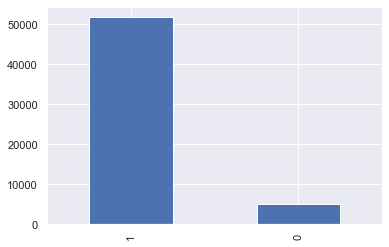

In [116]:
# ann_prediction_series.plot(kind='bar')
ann_prediction_series.value_counts().plot(kind='bar')

#### Predicted Hidden values

<AxesSubplot:>

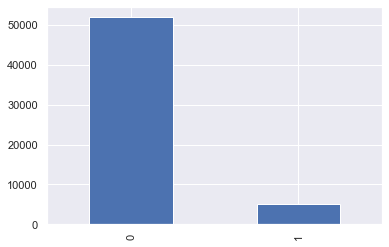

In [117]:
ann_prediction_hidden = [1 if x>=0.5 else 0 for x in ann_predictions_hidden]
ann_prediction_series_hidden = pd.Series(ann_prediction_hidden)
ann_prediction_series_hidden.value_counts().plot(kind='bar')

### Original hidden values

<AxesSubplot:>

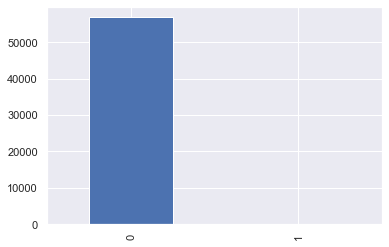

In [118]:
df_train_hidden['Class'].value_counts().plot(kind='bar')

#### Find out the threshold value for marking or reporting a transaction as fraudulent in your anomaly detection system.

##### For this kind of unbalanced dataset, it is more reasonable to look at Area Under ROC curve, since it has the nice property to be 0.5 for random scoring and 1.0 for perfect scoring whatever the balancing.

##### * 95.6% is auc score as threshold for Anoamly detection. Generated by Isolation forest.

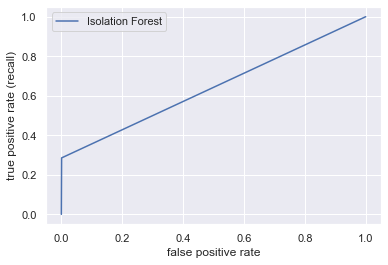

In [119]:
fp, tp, thres = roc_curve(Y_test,y_pred)
plt.plot(fp, tp, label="Isolation Forest")

# fp, tp, thres = roc_curve(y, np.random.rand(len(y)))
# plt.plot(fp, tp, label="Random")

plt.xlabel("false positive rate")
plt.ylabel("true positive rate (recall)")
plt.legend()

In [120]:
print("\n",fp,"\n\n",tp)


 [0.00000000e+00 9.01118706e-04 1.00000000e+00] 

 [0.         0.28571429 1.        ]


### Can this score be used as an engineered feature in the models developed previously? Are there any incremental gains in F1-Score? Why or Why not?

##### * F1 takes both false positives and false negatives into consideration. In imbalanced classes such as this, F1 is much more effective than accuracy at determining the performance of the model.
##### * F1 score for neural network model is better than traditional Machine Learning model.

### Be as creative as possible in finding other interesting insights.

In [121]:
df_train = copy.deepcopy(df_train_original)
df_train

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,38355.0,1.044,0.319,1.046,2.806,-0.561,-0.368,0.033,-0.042,-0.323,...,-0.240,-0.680,0.085,0.685,0.319,-0.205,0.002,0.038,49.67,0
1,22555.0,-1.665,0.808,1.806,1.903,-0.822,0.935,-0.825,0.976,1.747,...,-0.335,-0.511,0.036,0.148,-0.529,-0.567,-0.596,-0.220,16.94,0
2,2431.0,-0.324,0.602,0.865,-2.138,0.295,-1.252,1.072,-0.335,1.071,...,0.012,0.353,-0.342,-0.146,0.094,-0.804,0.229,-0.022,1.00,0
3,86773.0,-0.258,1.218,-0.585,-0.875,1.222,-0.311,1.074,-0.161,0.201,...,-0.425,-0.781,0.019,0.179,-0.316,0.097,0.270,-0.021,10.78,0
4,127202.0,2.142,-0.495,-1.937,-0.818,-0.025,-1.027,-0.152,-0.306,-0.869,...,0.010,0.022,0.079,-0.481,0.024,-0.279,-0.030,-0.044,39.96,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227840,62074.0,-1.994,1.735,-1.108,-2.672,1.605,3.042,-0.418,1.438,0.945,...,-0.304,-0.708,0.047,1.008,0.234,0.769,0.698,0.355,14.83,0
227841,32193.0,-0.440,1.063,1.582,-0.030,0.041,-0.904,0.730,-0.108,-0.513,...,-0.216,-0.532,-0.025,0.383,-0.165,0.069,0.269,0.123,2.58,0
227842,163864.0,0.828,-2.649,-3.161,0.209,-0.561,-1.570,1.613,-0.930,-1.319,...,0.350,0.002,-0.747,0.172,0.248,0.937,-0.258,0.038,748.04,0
227843,122571.0,-1.524,-6.287,-2.638,1.330,-1.672,1.958,1.359,0.082,0.753,...,1.329,0.001,-1.360,-1.508,-1.184,0.578,-0.329,0.230,1771.50,0


<AxesSubplot:>

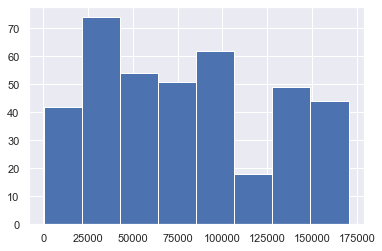

In [122]:
df_train[df_train['Class']==1].Time.hist(bins=8)

<AxesSubplot:>

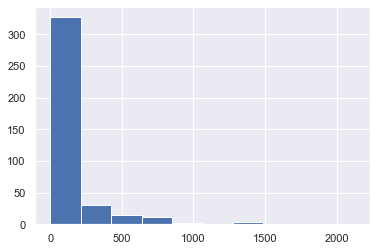

In [123]:
df_train[df_train['Class']==1].Amount.hist(bins=10)

In [124]:
df_train[df_train['Class']==1].Amount

266        11.38
360       316.06
421         0.01
734         0.00
854         1.00
           ...  
226409    175.90
226814    362.55
226817      1.00
226957      1.00
227531      1.00
Name: Amount, Length: 394, dtype: float64

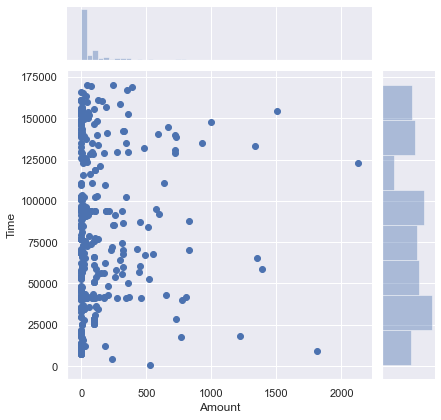

In [125]:
sns.jointplot(x="Amount", y="Time", data=df_train[df_train['Class']==1])

#### most of Fraud Transaction had less Amount